Генерация выборки объёма n = 25

In [4]:
import numpy as np
# import matplotlib.pyplot as plt
from matstat_facilities import *
from densities_distributions import *
import math

n = 25
lambda_param = 1

sample = np.random.exponential(scale=1/lambda_param, size=n)

print("Выборка:")
print(sample)

Выборка:
[0.12131174 0.50307209 0.64988276 3.27628427 0.32016058 0.26985491
 0.20449226 0.41644783 0.15491561 0.04261203 0.53203139 0.51180095
 0.17143556 0.1632448  1.72358973 1.65969218 2.25998275 0.06527292
 1.20032433 1.93614521 1.15374814 0.26373796 0.2340527  1.16815213
 1.71100093]


**Пункт a**

Поиск моды:

In [5]:
moda = get_moda(sample)
print("Мода:")
print(moda)

Мода:
[0.12131174 0.50307209 0.64988276 3.27628427 0.32016058 0.26985491
 0.20449226 0.41644783 0.15491561 0.04261203 0.53203139 0.51180095
 0.17143556 0.1632448  1.72358973 1.65969218 2.25998275 0.06527292
 1.20032433 1.93614521 1.15374814 0.26373796 0.2340527  1.16815213
 1.71100093]


Поиск медианы:

In [6]:
median = get_median(sample)
print("Медиана =", median)

Медиана = 0.5030720862599236


Поиск размаха:

In [7]:
scope = get_scope(sample)
print("Размах =", scope)

Размах = 3.2336722448172495


Поиск коэффициента асимметрии:

In [8]:
kf_asim = get_kf_asim(sample)
print("Коэффициент асимметрии =", kf_asim)

Коэффициент асимметрии = 1.2627383449782776


**Пункт b**

Построение эмпирической функции распределения:

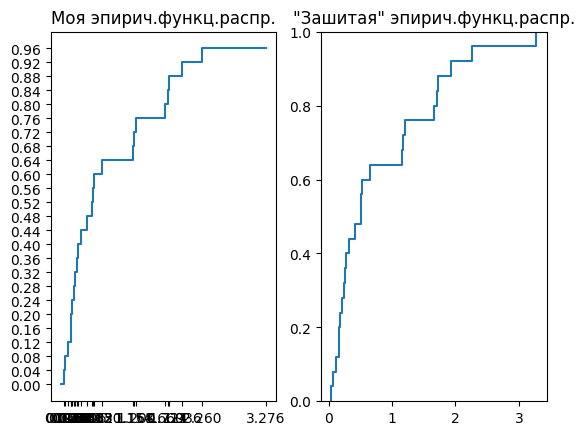

In [9]:
show_emp_distr_func(sample)

Построение гистограммы выборки:

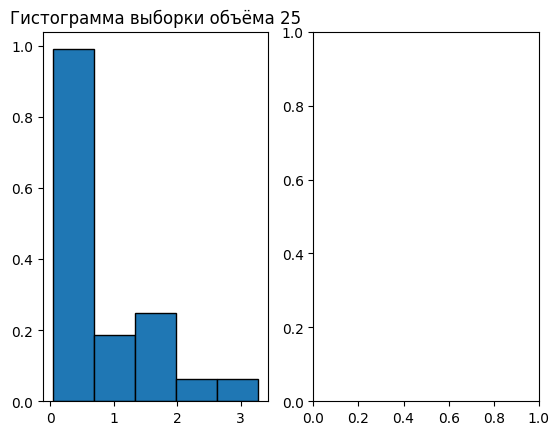

In [10]:
show_hist(sample, "Гистограмма выборки объёма " + str(n))

Построение boxplot'а:

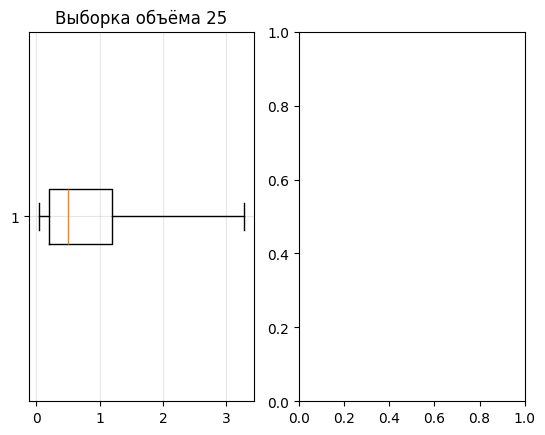

In [11]:
show_boxplot(sample, "Выборка объёма " + str(n))

**Пункт c**

Сравнение оценки плотности распределения среднего арифметического элементво выборки, полученной с помощью простейшей ЦПТ, с бутстраповской оценкой этой плотности:

In [14]:
# плотность распределения среднего арифметического выборки объёма n.
# ВЫВОД ФОРМУЛЫ НА ФОТОГРАФИЯХ НИЖЕ
def p_ar_mean(x):
    value = (1/(((1/n)*2*np.pi)**0.5)) * np.exp(-((x - 1)**2)/(2*(1/n)))
    # print("value =", value)
    return value

# именно по этой формуле производится рассчёт зелёной кривой на графике 

![](.\T2_point_C\T2_C_1.jpg)
![](.\T2_point_C\T2_C_2.jpg)
![](.\T2_point_C\T2_C_3.jpg)
![](.\T2_point_C\T2_C_4.jpg)

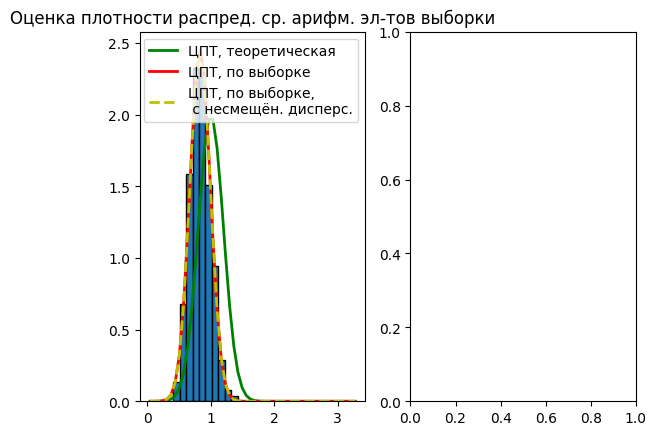

In [13]:
ar_means = gener_bootstr_mass(sample, 1000, get_ar_mean)
show_bootstr_compar_mean(sample, ar_means, p_ar_mean, 50)

**Пункт d**

Нахождение бутстрапом оценки плотности распределения коэффициента асимметрии

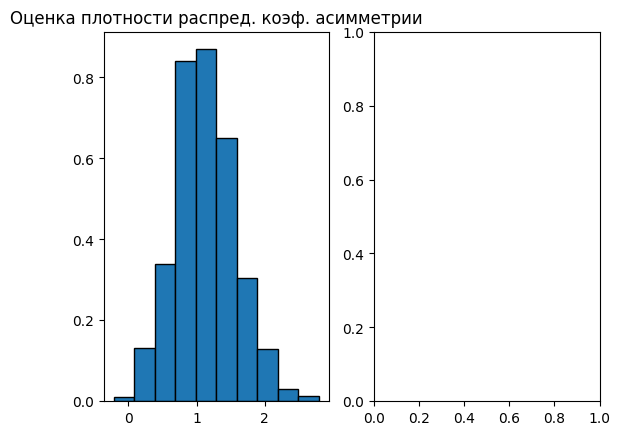

In [15]:
kf_asims = gener_bootstr_mass(sample, 1000, get_kf_asim)
show_hist(kf_asims, "Оценка плотности распред. коэф. асимметрии")


Поиск вероятности того, что коэффициент асимметрии будет меньше 1:

In [ ]:
chance = emp_distr_func(kf_asims, 1)
print("P(kf_asim < 1) =", chance)

P(kf_asim < 1) = 0.412


Пояснение:

Воспользовался определением функции распределения.

**Пункт e**

Сравнение плотности распределения медианы выборки с бутстраповской оценкой этой плотности:

![](.\T2_point_E\p(x).jpg)

![](.\T2_point_E\F(x).jpg)

In [ ]:
# теоретическая функция распределения медианы выборки
def F_median_teor(x):
    if x >= 0:
        return (1 - np.exp(-x))
    else:
        return 0

Вывод формулы, по которой расчитывается теоретическая плотность распределения медианы (в функции ниже):

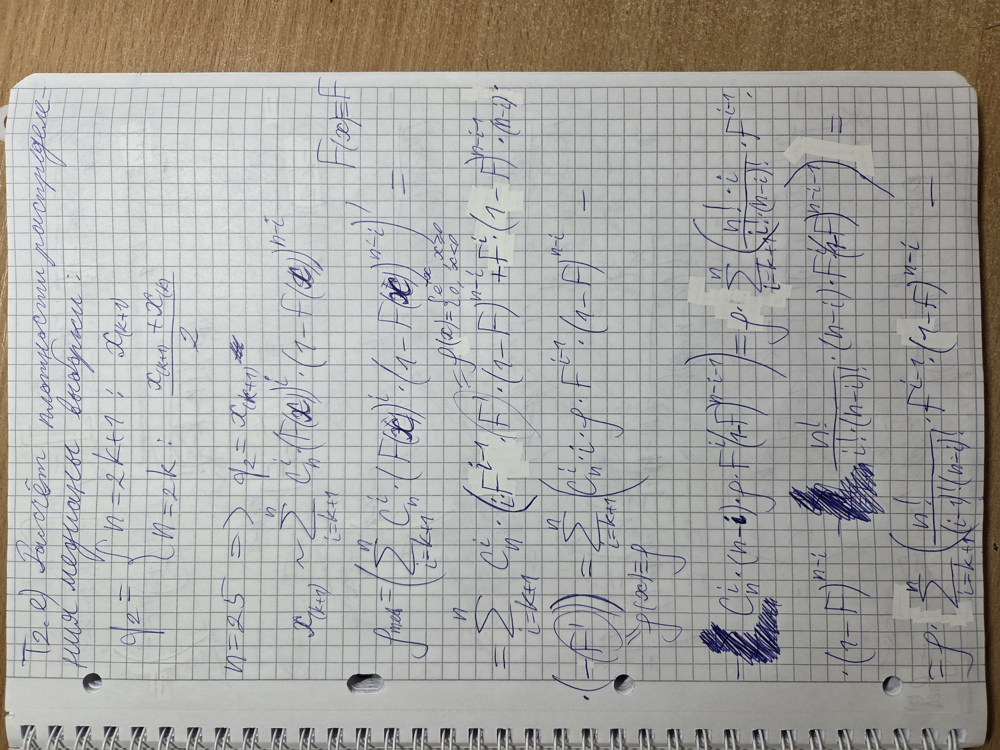 
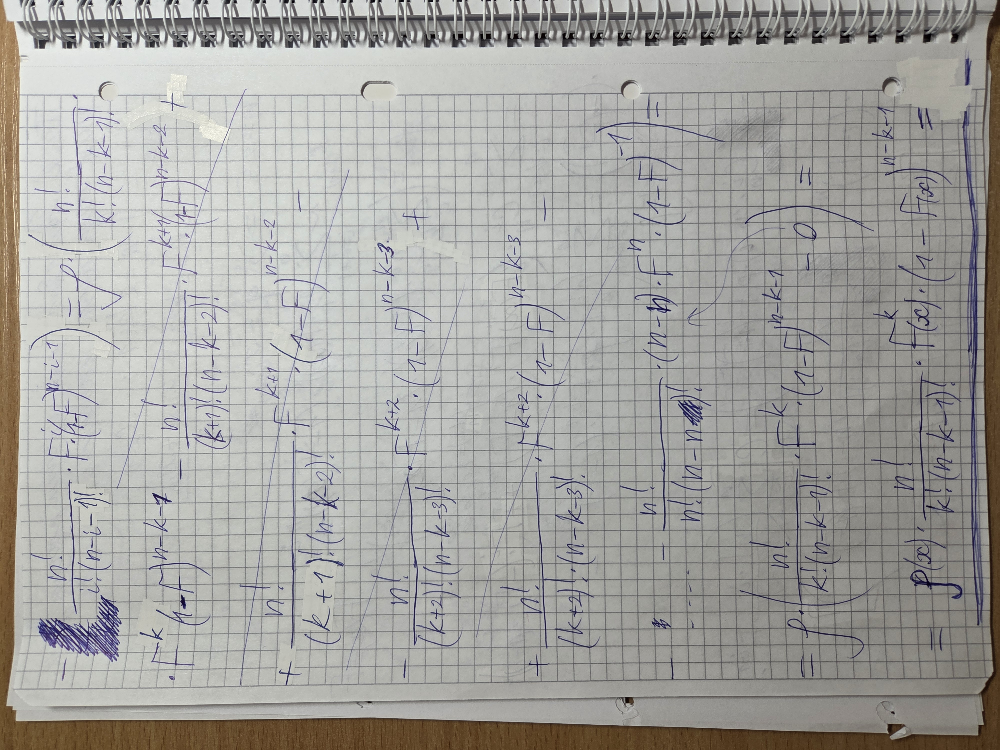 
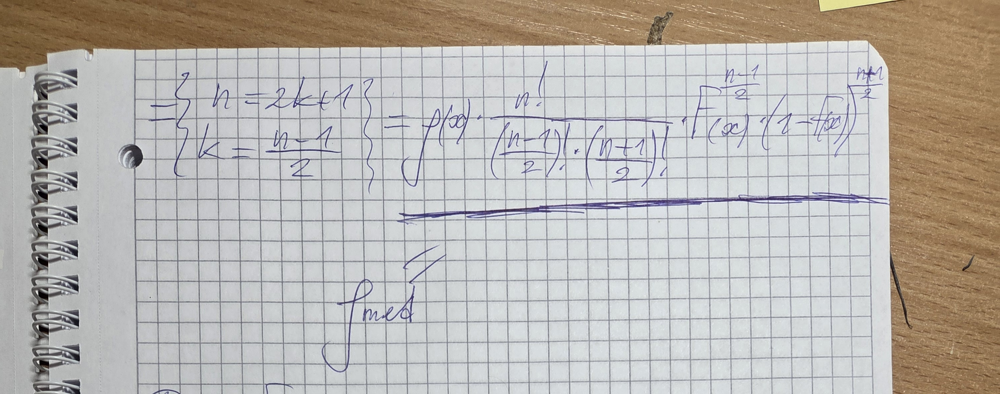

In [ ]:
def p_median_teor(x):
    k = int((n - 1) / 2)
    value = (p(x) * math.factorial(n)/(math.factorial(k) * math.factorial(n - k - 1))
             * (F_median_teor(x)**k) * (1 - F_median_teor(x))**(n - k - 1))
    # print("p_median_teor =", value)
    return value

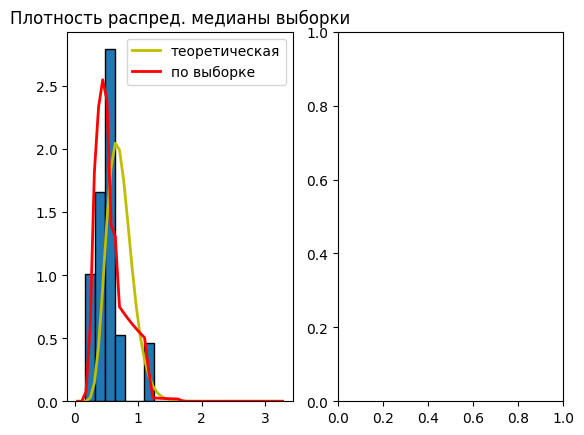

In [21]:
medians = gener_bootstr_mass(sample, 1000, get_median)
show_bootstr_compar_median(sample, medians, p_median_teor, 50)